## some nvidia gpu info

In [ ]:
!nvidia-smi
!free
!df -h

Tue Sep  2 09:40:56 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.133.20             Driver Version: 570.133.20     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   74C    P0             31W /   70W |    1355MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Dependencies

In [ ]:
!pip install git+https://github.com/lucidrains/denoising-diffusion-pytorch.git --upgrade
!pip install -q torchvision wandb

  Cloning https://github.com/lucidrains/denoising-diffusion-pytorch.git to /tmp/pip-req-build-78bgwls4
  Running command git clone --filter=blob:none --quiet https://github.com/lucidrains/denoising-diffusion-pytorch.git /tmp/pip-req-build-78bgwls4
  Resolved https://github.com/lucidrains/denoising-diffusion-pytorch.git to commit 8fac8e52126f5d8dbf93c4a8c3af4e9924000369
  Preparing metadata (setup.py) ... done


## mount drive

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

## arranging the checkpoints directory

In [ ]:
import glob
import os
import re

CHECKPOINT_DIR = "_ddpm_mnist_checkpoints"
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

def extract_epoch_number(filename):
    match = re.search(r"epoch(\d+)", filename)
    return int(match.group(1)) if match else -1

# --- BEFORE ---
print('==== BEFORE ====')
checkpoint_paths = glob.glob(os.path.join(CHECKPOINT_DIR, "*.pt"))
start_epoch = 0
for f in sorted(checkpoint_paths, key=extract_epoch_number, reverse=True):
    epoch = extract_epoch_number(f)
    if epoch >= start_epoch:
        print(f)

# --- DELETE ---
start_epoch = 99999  # Change CAREFULLY as needed (CHECKPOINTS OF LARGER EPOCH WILL BE DELETED)
for f in checkpoint_paths:
    epoch = extract_epoch_number(f)
    if epoch >= start_epoch:
        os.remove(f)

# --- AFTER ---
print('==== AFTER ====')
checkpoint_paths = glob.glob(os.path.join(CHECKPOINT_DIR, "*.pt"))
start_epoch = 0
for f in sorted(checkpoint_paths, key=extract_epoch_number, reverse=True):
    epoch = extract_epoch_number(f)
    if epoch >= start_epoch:
        print(f)


==== BEFORE ====
_ddpm_mnist_checkpoints/ddpm_epoch035.pt
_ddpm_mnist_checkpoints/ddpm_epoch034.pt
_ddpm_mnist_checkpoints/ddpm_epoch033.pt
_ddpm_mnist_checkpoints/ddpm_epoch032.pt
_ddpm_mnist_checkpoints/ddpm_epoch031.pt
_ddpm_mnist_checkpoints/ddpm_epoch030.pt
_ddpm_mnist_checkpoints/ddpm_epoch029.pt
_ddpm_mnist_checkpoints/ddpm_epoch028.pt
_ddpm_mnist_checkpoints/ddpm_epoch027.pt
_ddpm_mnist_checkpoints/ddpm_epoch026.pt
_ddpm_mnist_checkpoints/ddpm_epoch025.pt
_ddpm_mnist_checkpoints/ddpm_epoch024.pt
_ddpm_mnist_checkpoints/ddpm_epoch023.pt
_ddpm_mnist_checkpoints/ddpm_epoch022.pt
_ddpm_mnist_checkpoints/ddpm_epoch021.pt
_ddpm_mnist_checkpoints/ddpm_epoch020.pt
_ddpm_mnist_checkpoints/ddpm_epoch019.pt
_ddpm_mnist_checkpoints/ddpm_epoch018.pt
_ddpm_mnist_checkpoints/ddpm_epoch017.pt
_ddpm_mnist_checkpoints/ddpm_epoch016.pt
_ddpm_mnist_checkpoints/ddpm_epoch015.pt
_ddpm_mnist_checkpoints/ddpm_epoch014.pt
_ddpm_mnist_checkpoints/ddpm_epoch013.pt
_ddpm_mnist_checkpoints/ddpm_epoch012.pt

## dataset splits and their loaders

In [ ]:
from torchvision import datasets
import torchvision.transforms as T
import torch
from torch.utils.data import DataLoader, random_split

torch.manual_seed(42)  # ensure reproducibility across runs

# --- Config
BATCH_SIZE = 128
IMAGE_SIZE = 28
TIMESTEPS = 1000
SAMPLING_TIMESTEPS = 50

# --- Transform
transform = T.Compose([
    T.Resize(IMAGE_SIZE),
    T.ToTensor(),
    lambda x: x * 2 - 1
])

# --- Full original training set (60K)
full_train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)

# --- Deterministic split into train/val
VAL_SIZE = 5000
TRAIN_SIZE = len(full_train_dataset) - VAL_SIZE
train_dataset, val_dataset = random_split(full_train_dataset, [TRAIN_SIZE, VAL_SIZE])

# --- True test set (untouched)
test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)

# --- DataLoaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False)


## Model

In [ ]:
def build_model_and_diffusion(device, image_size=IMAGE_SIZE):
    model = Unet(
        dim=64,
        dim_mults=(1, 2, 4),
        channels=1
    ).to(device)

    diffusion = GaussianDiffusion(
        model,
        image_size=image_size,
        timesteps=TIMESTEPS,                      # training schedule (typically 1000)
        sampling_timesteps=SAMPLING_TIMESTEPS     # number of DDIM steps at inference time (typicall 50)
    ).to(device)

    return model, diffusion


## loss computations

In [1]:
def compute_loss(model, diffusion, x0, device):
    b = x0.size(0)
    T_full = diffusion.num_timesteps

    # Quadratic timestep sampling
    u = torch.rand(b, device=device)
    t = (u ** 2 * T_full).long().clamp(0, T_full - 1).view(-1)

    # Forward noising
    noise = torch.randn_like(x0)
    x_t = diffusion.q_sample(x_start=x0, t=t, noise=noise) # this is the x_t

    # Noise prediction
    pred_noise = model(x_t, t)

    # Loss
    return F.mse_loss(pred_noise, noise)

def compute_total_loss(model, diffusion, x0, device): # do do
    b = x0.size(0)
    T_full = diffusion.num_timesteps

    # Quadratic timestep sampling
    u = torch.rand(b, device=device)
    t = (u ** 2 * T_full).long().clamp(0, T_full - 1).view(-1)

    # Forward noising
    noise = torch.randn_like(x0)
    x_t = diffusion.q_sample(x_start=x0, t=t, noise=noise) # this is the x_t

    # Noise prediction
    pred_noise = model(x_t, t)

    X = x0
    Y = 0
    reg =

    n, m = len(X), len(Y)
    a = torch.ones(n, device=device) / n
    b = torch.ones(m, device=device) / m

    # Convert to torch tensors
    X_torch = torch.tensor(X, dtype=torch.float32, device=device)
    Y_torch = torch.tensor(Y, dtype=torch.float32, device=device)

    # GeomLoss Sinkhorn
    loss_fn = SamplesLoss(loss="sinkhorn", p=p, blur=reg, debias=debias)
    cost = loss_fn(a, X_torch, b, Y_torch)

    return float(cost.item())

    return F.mse_loss(pred_noise, noise) +

def compute_loss_ot(model, diffusion, x0, g, device):



def compute_val_loss(model, diffusion, val_loader, device, max_batches=None):
    model.eval()
    total_loss = 0.0
    count = 0
    with torch.no_grad():
        for i, (x, _) in enumerate(val_loader):
            if max_batches is not None and i >= max_batches:
                break
            x = x.to(device)
            loss = compute_loss(model, diffusion, x, device)
            total_loss += loss.item()
            count += 1
    return total_loss / count if count > 0 else float("nan")


SyntaxError: invalid syntax (ipython-input-1-2726348210.py, line 48)

## single step reconstruction

In [ ]:
import torch.nn.functional as F

def compute_psnr(x_recon, x_gt):
    """
    Compute PSNR per image in a batch, assuming input images in [-1, 1].
    """
    mse = F.mse_loss(x_recon, x_gt, reduction='none').mean(dim=(1, 2, 3))
    psnr = -10 * torch.log10(mse + 1e-8)
    return psnr

def visualize_reconstructions(model, diffusion, fixed_images, fixed_noise, device, epoch, prefix="train"):
    model.eval()
    with torch.no_grad():
        timesteps_to_eval = [50, 100, 900]  # Change as needed
        b = fixed_images.shape[0]

        psnr_results = []
        recon_grids = []
        noise_mse_results = []

        for t_val in timesteps_to_eval:
            t = torch.full((b,), t_val, device=device, dtype=torch.long)
            x_noisy = diffusion.q_sample(fixed_images, t=t, noise=fixed_noise)

            # Predict noise
            pred_noise = model(x_noisy, t)

            x_recon = diffusion.predict_start_from_noise(x_noisy, t, pred_noise).clamp(-1, 1)

            x_noisy_min = x_noisy.amin(dim=(1, 2, 3), keepdim=True)
            x_noisy_max = x_noisy.amax(dim=(1, 2, 3), keepdim=True)
            x_noisy_norm = 2 * (x_noisy - x_noisy_min) / (x_noisy_max - x_noisy_min + 1e-8) - 1

            # Compute PSNR
            psnr = compute_psnr(x_recon, fixed_images)
            psnr_mean = psnr.mean().item()
            psnr_results.append((t_val, psnr_mean))

            # Compute noise MSE
            noise_mse = F.mse_loss(pred_noise, fixed_noise, reduction='none').mean(dim=(1, 2, 3))
            noise_mse_results.append((t_val, noise_mse.mean().item()))

            combined = torch.cat([fixed_images, x_noisy_norm, x_recon], dim=0)
            combined = (combined + 1) / 2.0  # ← this rescales to [0, 1]
            grid = make_grid(combined, nrow=b, pad_value=1)

            # ✅ Append the grid so it gets logged
            recon_grids.append((t_val, psnr_mean, grid.cpu()))

        # Log scalar metrics
        for t_val, psnr_val in psnr_results:
            wandb.log({f"{prefix}/psnr_t{t_val}": psnr_val}, step=epoch)
        for t_val, noise_mse_val in noise_mse_results:
            wandb.log({f"{prefix}/noise_mse_t{t_val}": noise_mse_val}, step=epoch)

        # Log image grids with PSNR in the caption
        for t_val, psnr_val, grid in recon_grids:
            wandb.log({
                f"{prefix}/recon_grid_t{t_val}": wandb.Image(
                    grid,
                    caption=f"t={t_val} | PSNR={psnr_val:.2f}dB\nTop: GT | Middle: xₜ | Bottom: x̂₀"
                )
            }, step=epoch)


### Extractor

In [ ]:
from pathlib import Path
from typing import Optional, Tuple, List, Dict, Union
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms
from PIL import Image

class CFG:
    # Set these to your files, or leave as None to try TorchVision MNIST (offline envs may fail).
    train_path: Optional[str] = None     # e.g., "/content/mnist_train.npz" or folder path
    test_path:  Optional[str] = None     # e.g., "/content/mnist_test.npz"  or folder path
    gen_path:   Optional[str] = None     # e.g., "/content/mnist_gen.npz"   or folder path (optional)

    # Data
    batch_size: int = 512
    num_workers: int = 2

    # Model / training
    device: str = "cuda" if torch.cuda.is_available() else "cpu"
    seed: int = 42
    epochs: int = 3             # quick train for feature extractor
    lr: float = 1e-3

    # Features
    feature_dim: int = 128

    # OT
    sinkhorn_reg: float = 0.05   # epsilon for entropic regularization
    ot_samples_per_class: int = 2000  # cap per class to balance cost & speed

cfg = CFG()

In [ ]:

import torch.nn as nn
import torch.nn.functional as F
import torch

class SimpleMNISTFeatureNet(nn.Module):
    def __init__(self, feature_dim=128):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(1, 32, 3, 1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, 1), nn.ReLU(), nn.MaxPool2d(2)
        )
        self.flatten = nn.Flatten()
        self.fc_feat = nn.Linear(64 * 5 * 5, feature_dim)
        self.fc_out = nn.Linear(feature_dim, 10)

    def forward(self, x):
        x = self.conv(x)
        x = self.flatten(x)
        feat = F.relu(self.fc_feat(x))
        out = self.fc_out(feat)
        return out, feat

extractor = SimpleMNISTFeatureNet(feature_dim=cfg.feature_dim).to(cfg.device)
sum(p.numel() for p in extractor.parameters())/1e3

225.034

In [ ]:
extractor.load_state_dict(torch.load("mnist_featnet.pt", map_location=cfg.device))

<All keys matched successfully>

In [ ]:
@torch.no_grad()
def extract_features(model, loader, device="cpu"):
    """
    Runs the model on a DataLoader and collects features and labels.
    Assumes model(x) -> (logits, features).
    Returns:
        feats:  (N, D) np.ndarray
        labels: (N,)   np.ndarray (int) or None if unavailable
    """
    model.eval()
    feats, labels = [], []
    for batch in loader:
        # Support multiple dataset output formats
        if isinstance(batch, (list, tuple)) and len(batch) == 2:
            x, y = batch
        elif isinstance(batch, dict):
            x, y = batch.get("x"), batch.get("y", -1)
        else:
            x, y = batch, -1

        x = x.to(device)
        logits, feat = model(x)
        feats.append(feat.cpu())
        if not torch.is_tensor(y):
            y = torch.as_tensor(y)
        labels.append(y.clone().cpu())

    feats = torch.cat(feats, dim=0).numpy()
    # labels = torch.cat(labels, dim=0).numpy() if len(labels) > 0 else None
    return feats, labels

In [ ]:
train_imgs = torch.load("train_mnist.pt")
train_imgs = train_imgs[:2000]
train_loader = torch.utils.data.DataLoader(train_imgs, batch_size=64, shuffle=True)
test_imgs = torch.load("test_mnist.pt")
test_imgs = test_imgs[:2000]
test_loader  = torch.utils.data.DataLoader(test_imgs, batch_size=64, shuffle=True)

In [ ]:
train_feats, train_labels = extract_features(extractor, train_loader, device=cfg.device)
test_feats,  test_labels  = extract_features(extractor, test_loader,  device=cfg.device)

In [ ]:
!pip install POT

In [ ]:
import ot

In [ ]:


#@title ---------- Sinkhorn ----------

def _safe_max(C: np.ndarray) -> float:
    cmax = np.max(C)
    return 1.0 if (not np.isfinite(cmax) or cmax <= 0) else float(cmax)

def sinkhorn_cost(
    X: np.ndarray,
    Y: np.ndarray,
    reg: float = 0.1,
    metric: str = "euclidean",
    nit: int = 100,
    stopThr: float = 1e-9,
) -> float:
    """
    Compute entropic OT cost between X and Y using POT's sinkhorn.
    We scale the cost matrix for stability and then unscale the final cost.
    """
    n, m = len(X), len(Y)
    a = ot.utils.unif(n).astype(np.float64)
    b = ot.utils.unif(m).astype(np.float64)

    C = ot.dist(X.astype(np.float64), Y.astype(np.float64), metric=metric)
    cmax = _safe_max(C)
    M = C / cmax
    T = ot.sinkhorn(a, b, M, reg=reg, numItermax=nit, stopThr=stopThr)
    cost = float(np.sum(M * T) * cmax)
    return cost

In [ ]:
ot_train_test = sinkhorn_cost(train_feats, test_feats)
ot_train_test

0.4995099729182783

In [ ]:
#@title ---------- FID ----------

# -------------------------
# FID utilities
# -------------------------
def _cov_and_mean(X: np.ndarray, eps: float = 1e-6):
    """
    Covariance (D x D) and mean (D,) for X (N x D), with eps*I for stability.
    """
    X = np.asarray(X, dtype=np.float64)
    mu = np.mean(X, axis=0)
    cov = np.cov(X, rowvar=False)
    d = cov.shape[0]
    cov = cov + eps * np.eye(d, dtype=np.float64)
    return cov, mu

def _trace_sqrt_product(cov1: np.ndarray, cov2: np.ndarray, eps: float = 1e-6) -> float:
    """
    Tr[ (cov1^{1/2} cov2 cov1^{1/2})^{1/2} ] with SciPy if available, else NumPy.
    """
    cov1 = np.asarray(cov1, dtype=np.float64)
    cov2 = np.asarray(cov2, dtype=np.float64)
    try:
        import scipy.linalg as sla  # type: ignore
        w1, V1 = np.linalg.eigh(cov1)
        w1 = np.clip(w1, 0.0, None)
        cov1_sqrt = (V1 * np.sqrt(w1)) @ V1.T
        A = cov1_sqrt @ cov2 @ cov1_sqrt
        A = (A + A.T) * 0.5
        sqrtA = sla.sqrtm(A)
        if np.iscomplexobj(sqrtA):
            sqrtA = sqrtA.real
        return float(np.trace(sqrtA))
    except Exception:
        w1, V1 = np.linalg.eigh(cov1)
        w1 = np.clip(w1, 0.0, None)
        cov1_sqrt = (V1 * np.sqrt(w1)) @ V1.T
        A = cov1_sqrt @ cov2 @ cov1_sqrt
        A = (A + A.T) * 0.5
        wa, _ = np.linalg.eigh(A)
        wa = np.clip(wa, 0.0, None)
        return float(np.sum(np.sqrt(wa + eps)))

def compute_fid(X: np.ndarray, Y: np.ndarray, eps: float = 1e-6) -> float:
    """
    Fréchet distance between feature sets X and Y.
    """
    cov1, mu1 = _cov_and_mean(X, eps=eps)
    cov2, mu2 = _cov_and_mean(Y, eps=eps)
    diff = mu1 - mu2
    trace_term = np.trace(cov1) + np.trace(cov2) - 2.0 * _trace_sqrt_product(cov1, cov2, eps=eps)
    fid = float(diff @ diff + trace_term)
    return max(fid, 0.0)


In [ ]:
fid_train_test = compute_fid(train_feats, test_feats)
fid_train_test

0.006060619315082855

In [ ]:


#@title ---------- MMD helpers ----------
def _pairwise_sq_dists(A: np.ndarray, B: np.ndarray) -> np.ndarray:
    """
    Fast pairwise squared Euclidean distances between rows of A (nxd) and B (mxd).
    Returns (n x m) matrix D where D[i,j] = ||A[i]-B[j]||^2.
    """
    A2 = np.sum(A * A, axis=1, keepdims=True)        # (n,1)
    B2 = np.sum(B * B, axis=1, keepdims=True).T      # (1,m)
    return A2 + B2 - 2.0 * (A @ B.T)

def _rbf_kernel_from_sq_dists(D2: np.ndarray, sigmas: np.ndarray) -> np.ndarray:
    """
    Multi-bandwidth RBF kernel: sum_{s in sigmas} exp(-D2 / (2*s^2)).
    """
    K = np.exp(-D2[..., None] / (2.0 * (sigmas[None, None, :] ** 2)))
    return np.sum(K, axis=2)

def _median_heuristic_sigmas(X: np.ndarray, Y: np.ndarray, k: int = 1) -> np.ndarray:
    """
    Median heuristic for RBF bandwidth(s).
    If k > 1, returns a geometric ladder around the median.
    """
    Z = np.vstack([X, Y])
    D2 = _pairwise_sq_dists(Z, Z)
    iu = np.triu_indices_from(D2, k=1)
    med = np.sqrt(np.median(D2[iu]) + 1e-12)
    if not np.isfinite(med) or med <= 0:
        med = 1.0
    if k == 1:
        return np.array([med], dtype=float)
    exps = np.linspace(-1.0, 1.0, k)  # ~ one order of magnitude span
    return med * (10.0 ** exps)

def compute_mmd_rbf(
    X: np.ndarray,
    Y: np.ndarray,
    sigmas: np.ndarray | None = None,
    use_median_heuristic: bool = True,
    k_heuristic: int = 1,
) -> dict:
    """
    Unbiased (U-statistic) MMD^2 with (possibly multi) RBF kernel(s).
    Returns dict with:
      - mmd2: float
      - sigmas: np.ndarray of bandwidths actually used
    """
    X = np.asarray(X, dtype=float)
    Y = np.asarray(Y, dtype=float)
    n, m = X.shape[0], Y.shape[0]
    if n < 2 or m < 2:
        raise ValueError("MMD requires at least 2 samples in each set for unbiased estimate.")

    if sigmas is None and use_median_heuristic:
        sigmas = _median_heuristic_sigmas(X, Y, k=k_heuristic)
    elif sigmas is None:
        sigmas = np.array([1.0], dtype=float)
    else:
        sigmas = np.asarray(sigmas, dtype=float)

    Dxx = _pairwise_sq_dists(X, X)
    Dyy = _pairwise_sq_dists(Y, Y)
    Dxy = _pairwise_sq_dists(X, Y)

    Kxx = _rbf_kernel_from_sq_dists(Dxx, sigmas)
    Kyy = _rbf_kernel_from_sq_dists(Dyy, sigmas)
    Kxy = _rbf_kernel_from_sq_dists(Dxy, sigmas)

    # Unbiased MMD^2: remove diagonals in Kxx, Kyy; Kxy uses all pairs
    np.fill_diagonal(Kxx, 0.0)
    np.fill_diagonal(Kyy, 0.0)
    term_xx = Kxx.sum() / (n * (n - 1))
    term_yy = Kyy.sum() / (m * (m - 1))
    term_xy = Kxy.mean()

    mmd2 = term_xx + term_yy - 2.0 * term_xy
    return {"mmd2": float(mmd2), "sigmas": sigmas}

In [ ]:
mmd_train_test = compute_mmd_rbf(train_feats, test_feats)["mmd2"]
mmd_train_test

0.004256625435147043

In [ ]:
ot_train_gen = []
fid_train_gen = []
mmd_train_gen = []
ot_test_gen = []
fid_test_gen = []
mmd_test_gen = []

## training script

In [ ]:
import torch
import torchvision
import torchvision.transforms as T
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from tqdm import tqdm
import os
import glob
import wandb
import sys
import math
from denoising_diffusion_pytorch import Unet, GaussianDiffusion


# --- Config
EPOCHS = 35
SAVE_EVERY = 1
NUM_RECONS = 20

max_batches = None  # set to int for quick debug

# --- Init wandb
wandb.init(project="ddpm-mnist-train", config={
    "epochs": EPOCHS,
    "batch_size": BATCH_SIZE,
    "image_size": IMAGE_SIZE
})
wandb.define_metric("epoch")
wandb.define_metric("train_loss", step_metric="epoch")
wandb.define_metric("val_loss", step_metric="epoch")
wandb.define_metric("recon_psnr", step_metric="epoch")


# --- Device setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Training on", device)

# --- Fixed validation images, noise, and timesteps
fixed_loader = DataLoader(val_dataset, batch_size=NUM_RECONS, shuffle=False)
fixed_images, _ = next(iter(fixed_loader))
fixed_images = fixed_images.to(device)

fixed_noise = torch.randn_like(fixed_images)
norms = fixed_noise.view(NUM_RECONS, -1).norm(dim=1)
sorted_idx = norms.argsort()
fixed_noise = fixed_noise[sorted_idx]
fixed_images = fixed_images[sorted_idx]

# --- Model & Diffusion
model, diffusion = build_model_and_diffusion(device=device, image_size=IMAGE_SIZE)

# --- Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)

# --- Resume from checkpoint if available
latest_ckpt = None
for f in sorted(os.listdir(CHECKPOINT_DIR), reverse=True):
    print('f:',f)
    if f.endswith(".pt"):
        latest_ckpt = os.path.join(CHECKPOINT_DIR, f)
        break

# start_epoch = 1
# if latest_ckpt:
#     print("Resuming from", latest_ckpt)
#     ckpt = torch.load(latest_ckpt, map_location=device)
#     model.load_state_dict(ckpt["model"])
#     start_epoch = ckpt["epoch"] + 1
start_epoch = 1
passive_phase_per_epoch = False

# --- Training loop
for epoch in range(start_epoch, EPOCHS + 1):
    ckpt_name = f"ddpm_epoch{epoch:03d}.pt"
    ckpt_path = os.path.join(CHECKPOINT_DIR, ckpt_name)

    if os.path.exists(ckpt_path):
        print(f"🔁 Skipping training for epoch {epoch} — loading checkpoint.")
        ckpt = torch.load(ckpt_path, map_location=device)
        model.load_state_dict(ckpt["model"])

        if passive_phase_per_epoch:
            model.eval()
            N = 2000        # total images
            B = 64          # batch size for sampling
            all_imgs = []

            with torch.no_grad():
                num_batches = math.ceil(N / B)
                for _ in range(num_batches):
                    bs = min(B, N - len(all_imgs))
                    x = diffusion.sample(batch_size=bs)   # [bs, 1, 28, 28]
                    all_imgs.append(x)

            # stack into one big tensor [5000,1,28,28]
            gen_imgs = torch.cat(all_imgs, dim=0)[:N]
            gen_loader  = torch.utils.data.DataLoader(gen_imgs, batch_size=64, shuffle=True)
            gen_feats,  gen_labels  = extract_features(extractor, gen_loader,  device=cfg.device)

            ot_train_gen.append(sinkhorn_cost(train_feats, gen_feats))
            fid_train_gen.append(compute_fid(train_feats, gen_feats))
            mmd_train_gen.append(compute_mmd_rbf(train_feats, gen_feats)["mmd2"])

            ot_test_gen.append(sinkhorn_cost(test_feats, gen_feats))
            fid_test_gen.append(compute_fid(test_feats, gen_feats))
            mmd_test_gen.append(compute_mmd_rbf(test_feats, gen_feats)["mmd2"])

            print(ot_train_gen[epoch-1], ot_test_gen[epoch-1])
            print(fid_train_gen[epoch-1], fid_test_gen[epoch-1])
            print(fid_train_gen[epoch-1], fid_test_gen[epoch-1])

    else:
        model.train()
        pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS}")
        total_loss = 0

        for i, (x, _) in enumerate(pbar):
            if max_batches is not None and i >= max_batches:
                break
            # loss
            x0 = x.to(device)
            loss = compute_loss(model, diffusion, x0, device) # + delta * compute_loss_ot(model, diffusion, x0, size_of_g, device)
            loss.backward()
            # optimization
            optimizer.step()
            optimizer.zero_grad()

            total_loss += loss.item()
            pbar.set_postfix(loss=loss.item())

        avg_loss = total_loss / len(train_loader)
        wandb.log({"epoch": epoch, "train_loss": avg_loss}, step=epoch)
        print(f"Epoch {epoch}: avg loss = {avg_loss:.4f}")

        # Save checkpoint
        if epoch % SAVE_EVERY == 0:
            torch.save({"epoch": epoch, "model": model.state_dict()}, ckpt_path)
            print("Checkpoint saved:", ckpt_path)


    # Sampling
    if epoch % SAVE_EVERY == 0:
        model.eval()
        with torch.no_grad():

            # --- Get real validation images (first 100) ---
            real_images = next(iter(val_loader))[0][:100].to(device)  # (B, C, H, W)
            real_images_flat = real_images.flatten().cpu().numpy()

            # --- Sample from DDIM with 50 and 100 steps ---
            sampled_ddim_50 = diffusion.ddim_sample((100, 1, 28, 28))

            sampled_binary = (sampled_ddim_50 > 0.6).float() # threshold choice was arbitrary (0.77 gives GT statistics)

            # --- Extract numpy arrays for histogram ---
            ddim50 = sampled_ddim_50.flatten().cpu().numpy()
            binary = sampled_binary.flatten().cpu().numpy()

            # --- Create image grids ---
            from torchvision.utils import make_grid

            grid_real = make_grid((real_images * 255).round().to(torch.uint8), nrow=10, pad_value=255)
            grid_50 = make_grid((sampled_ddim_50 * 255).round().to(torch.uint8), nrow=10, pad_value=255)
            grid_binary = make_grid((sampled_binary * 255).round().to(torch.uint8), nrow=10, pad_value=255)

            # --- Log everything to WandB ---
            wandb.log({
                "real_images": wandb.Image(grid_real, caption=f"Real Validation Images (Epoch {epoch})"),
                "samples_ddim_50": wandb.Image(grid_50, caption=f"DDIM Samples (50 Steps, Epoch {epoch})"),
                "samples_binary": wandb.Image(grid_binary, caption=f"DDIM Binary Thresholded (100 Steps, Epoch {epoch})"),
            }, step=epoch)


    # Reconstructions
    if epoch % SAVE_EVERY == 0:
        visualize_reconstructions(model, diffusion, fixed_images, fixed_noise, device, epoch, prefix="train")
        # --- Validation loss ---
        val_loss = compute_val_loss(model, diffusion, val_loader, device)
        wandb.log({"epoch": epoch, "val_loss": val_loss}, step=epoch)
        print(f"✅ Epoch {epoch}: val loss = {val_loss:.4f}")


epoch,▁
train/noise_mse_t100,▁
train/noise_mse_t50,▁
train/noise_mse_t900,▁
train/psnr_t100,▁
train/psnr_t50,▁
train/psnr_t900,▁
val_loss,▁
epoch,1
train/noise_mse_t100,0.10544
train/noise_mse_t50,0.13531


Training on cuda
f: ddpm_epoch035.pt
🔁 Skipping training for epoch 1 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8612367021324462 0.862275480500032
0.6732578993950579 0.6776990658244508
0.6732578993950579 0.6776990658244508


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 1: val loss = 0.1043
🔁 Skipping training for epoch 2 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.869595653478293 0.8706324359934029
0.6659537327569953 0.6711844239703384
0.6659537327569953 0.6711844239703384


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 2: val loss = 0.0803
🔁 Skipping training for epoch 3 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8611688658697504 0.8626708729175625
0.6488020894845052 0.6549413614038421
0.6488020894845052 0.6549413614038421


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 3: val loss = 0.0752
🔁 Skipping training for epoch 4 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8543863507612871 0.8554327319752226
0.6375637005361643 0.6427344609768142
0.6375637005361643 0.6427344609768142


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 4: val loss = 0.0700
🔁 Skipping training for epoch 5 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8589497075450045 0.8599928422857068
0.6405343117778045 0.6457112635929154
0.6405343117778045 0.6457112635929154


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 5: val loss = 0.0696
🔁 Skipping training for epoch 6 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.851916789306829 0.8525553734258836
0.6337569411411079 0.6380277240742572
0.6337569411411079 0.6380277240742572


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 6: val loss = 0.0662
🔁 Skipping training for epoch 7 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8586772354107551 0.8593948228386985
0.6375386409617988 0.6422408282214067
0.6375386409617988 0.6422408282214067


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 7: val loss = 0.0633
🔁 Skipping training for epoch 8 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8598892569918322 0.8610242674374203
0.6443840322550947 0.6498806371107482
0.6443840322550947 0.6498806371107482


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 8: val loss = 0.0662
🔁 Skipping training for epoch 9 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8691259353962293 0.8702425253637462
0.6588024177640821 0.6642625911591231
0.6588024177640821 0.6642625911591231


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 9: val loss = 0.0637
🔁 Skipping training for epoch 10 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8550587561127828 0.856054635744786
0.6366172462743284 0.6417309385013874
0.6366172462743284 0.6417309385013874


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 10: val loss = 0.0622
🔁 Skipping training for epoch 11 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8603681063666963 0.8613522618628535
0.6429580940182177 0.6482338767810084
0.6429580940182177 0.6482338767810084


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 11: val loss = 0.0635
🔁 Skipping training for epoch 12 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8589177625026726 0.8600378248272007
0.6393287642601457 0.6448676896285905
0.6393287642601457 0.6448676896285905


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 12: val loss = 0.0612
🔁 Skipping training for epoch 13 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.855062539512568 0.8559567238174827
0.6363181899445128 0.6413389655165367
0.6363181899445128 0.6413389655165367


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 13: val loss = 0.0606
🔁 Skipping training for epoch 14 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8584848630703121 0.8590433614965897
0.637908810656903 0.6423188911084174
0.637908810656903 0.6423188911084174


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 14: val loss = 0.0609
🔁 Skipping training for epoch 15 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8622224181076428 0.8632387879121715
0.6453229170227537 0.6506614877988094
0.6453229170227537 0.6506614877988094


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 15: val loss = 0.0604
🔁 Skipping training for epoch 16 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8593726646269638 0.859919042457059
0.6421144414069861 0.6464446631160218
0.6421144414069861 0.6464446631160218


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 16: val loss = 0.0605
🔁 Skipping training for epoch 17 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8624238076741924 0.8635579840735168
0.6486583903728746 0.6541607204408315
0.6486583903728746 0.6541607204408315


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 17: val loss = 0.0604
🔁 Skipping training for epoch 18 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8576555335833657 0.8584550769501149
0.6375901576357371 0.6423793822752367
0.6375901576357371 0.6423793822752367


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 18: val loss = 0.0615
🔁 Skipping training for epoch 19 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8599656592754651 0.8609412649333517
0.6453943726163429 0.6505232543837314
0.6453943726163429 0.6505232543837314


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 19: val loss = 0.0593
🔁 Skipping training for epoch 20 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8661261010321106 0.8671112682149074
0.6509582967709935 0.6562353480457916
0.6509582967709935 0.6562353480457916


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 20: val loss = 0.0600
🔁 Skipping training for epoch 21 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8589625448745521 0.8601639943620056
0.6382018540025224 0.643940557094565
0.6382018540025224 0.643940557094565


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 21: val loss = 0.0583
🔁 Skipping training for epoch 22 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8643307391362056 0.8654144912068304
0.6480807172001546 0.6535750473130211
0.6480807172001546 0.6535750473130211


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 22: val loss = 0.0590
🔁 Skipping training for epoch 23 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8601053882439362 0.8613179817630846
0.639805086320048 0.6454542128357352
0.639805086320048 0.6454542128357352


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 23: val loss = 0.0588
🔁 Skipping training for epoch 24 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8541223685121514 0.8550577081377411
0.6327609114898715 0.6378547093683842
0.6327609114898715 0.6378547093683842


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 24: val loss = 0.0623
🔁 Skipping training for epoch 25 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8629438326524445 0.8641710902728633
0.6491156432327296 0.6548203565942535
0.6491156432327296 0.6548203565942535


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 25: val loss = 0.0580
🔁 Skipping training for epoch 26 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.861161163026028 0.8621542389315576
0.6426539880476505 0.6478483077058851
0.6426539880476505 0.6478483077058851


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 26: val loss = 0.0577
🔁 Skipping training for epoch 27 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8529495140902654 0.8538935147634521
0.630828605972901 0.6359757827459536
0.630828605972901 0.6359757827459536


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 27: val loss = 0.0587
🔁 Skipping training for epoch 28 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8544724568338212 0.8552260164020926
0.6306460778465093 0.6353124208832092
0.6306460778465093 0.6353124208832092


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 28: val loss = 0.0583
🔁 Skipping training for epoch 29 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8675217859013122 0.8686953514196689
0.6559661584727025 0.6615451554629195
0.6559661584727025 0.6615451554629195


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 29: val loss = 0.0598
🔁 Skipping training for epoch 30 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8588974358948289 0.8599822965703477
0.64290584389664 0.6482211744762804
0.64290584389664 0.6482211744762804


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 30: val loss = 0.0569
🔁 Skipping training for epoch 31 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8596082433465444 0.8607127995384521
0.6366802690716303 0.6422316681273694
0.6366802690716303 0.6422316681273694


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 31: val loss = 0.0577
🔁 Skipping training for epoch 32 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8631881550126084 0.8644438746492271
0.647773291936653 0.653616289476862
0.647773291936653 0.653616289476862


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 32: val loss = 0.0577
🔁 Skipping training for epoch 33 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8646765893427295 0.8658074645923515
0.6496002425872792 0.6550755681586815
0.6496002425872792 0.6550755681586815


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 33: val loss = 0.0568
🔁 Skipping training for epoch 34 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8648545760402381 0.8662011357550559
0.6518166138391756 0.6577292789285383
0.6518166138391756 0.6577292789285383


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 34: val loss = 0.0565
🔁 Skipping training for epoch 35 — loading checkpoint.


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

0.8633175530243762 0.8643285362655387
0.6484609067062765 0.6536452342436296
0.6484609067062765 0.6536452342436296


sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

✅ Epoch 35: val loss = 0.0563


In [ ]:
with open("ot_train_gen.txt", "w") as f:
    f.write(" ".join(map(str, ot_train_gen)))
with open("fid_train_gen.txt", "w") as f:
    f.write(" ".join(map(str, fid_train_gen)))
with open("mmd_train_gen.txt", "w") as f:
    f.write(" ".join(map(str, mmd_train_gen)))

with open("ot_test_gen.txt", "w") as f:
    f.write(" ".join(map(str, ot_test_gen)))
with open("fid_test_gen.txt", "w") as f:
    f.write(" ".join(map(str, fid_test_gen)))
with open("mmd_test_gen.txt", "w") as f:
    f.write(" ".join(map(str, mmd_test_gen)))

In [ ]:
print(ot_train_test)
print(fid_train_test)
print(mmd_train_test)

0.4995099729182783
0.006060619315082855
0.004256625435147043


In [ ]:
print(ot_train_gen)
print(ot_test_gen)

[0.8612367021324462, 0.869595653478293, 0.8611688658697504, 0.8543863507612871, 0.8589497075450045, 0.851916789306829, 0.8586772354107551, 0.8598892569918322, 0.8691259353962293, 0.8550587561127828, 0.8603681063666963, 0.8589177625026726, 0.855062539512568, 0.8584848630703121, 0.8622224181076428, 0.8593726646269638, 0.8624238076741924, 0.8576555335833657, 0.8599656592754651, 0.8661261010321106, 0.8589625448745521, 0.8643307391362056, 0.8601053882439362, 0.8541223685121514, 0.8629438326524445, 0.861161163026028, 0.8529495140902654, 0.8544724568338212, 0.8675217859013122, 0.8588974358948289, 0.8596082433465444, 0.8631881550126084, 0.8646765893427295, 0.8648545760402381, 0.8633175530243762]
[0.862275480500032, 0.8706324359934029, 0.8626708729175625, 0.8554327319752226, 0.8599928422857068, 0.8525553734258836, 0.8593948228386985, 0.8610242674374203, 0.8702425253637462, 0.856054635744786, 0.8613522618628535, 0.8600378248272007, 0.8559567238174827, 0.8590433614965897, 0.8632387879121715, 0.85

In [ ]:
print(fid_train_gen)
print(fid_test_gen)

[0.6732578993950579, 0.6659537327569953, 0.6488020894845052, 0.6375637005361643, 0.6405343117778045, 0.6337569411411079, 0.6375386409617988, 0.6443840322550947, 0.6588024177640821, 0.6366172462743284, 0.6429580940182177, 0.6393287642601457, 0.6363181899445128, 0.637908810656903, 0.6453229170227537, 0.6421144414069861, 0.6486583903728746, 0.6375901576357371, 0.6453943726163429, 0.6509582967709935, 0.6382018540025224, 0.6480807172001546, 0.639805086320048, 0.6327609114898715, 0.6491156432327296, 0.6426539880476505, 0.630828605972901, 0.6306460778465093, 0.6559661584727025, 0.64290584389664, 0.6366802690716303, 0.647773291936653, 0.6496002425872792, 0.6518166138391756, 0.6484609067062765]
[0.6776990658244508, 0.6711844239703384, 0.6549413614038421, 0.6427344609768142, 0.6457112635929154, 0.6380277240742572, 0.6422408282214067, 0.6498806371107482, 0.6642625911591231, 0.6417309385013874, 0.6482338767810084, 0.6448676896285905, 0.6413389655165367, 0.6423188911084174, 0.6506614877988094, 0.64

In [ ]:
print(mmd_train_gen)
print(mmd_test_gen)

[0.7368948194581539, 0.7241298871045714, 0.7092173615886883, 0.7014026927374872, 0.7036238628351448, 0.6991090251310902, 0.7011703464823256, 0.7053225644196403, 0.7160021323150846, 0.7020989832024535, 0.7038499169611221, 0.7012284628215251, 0.7001948828513949, 0.7001750895199145, 0.7059881355436649, 0.7058410220006985, 0.7108149712954281, 0.7006613469463264, 0.7077364701575574, 0.7087769341504425, 0.700313869726852, 0.7087399762770488, 0.7000355548781857, 0.6975158580470031, 0.710538829053257, 0.7034561117192194, 0.6965946608958181, 0.6944167414684996, 0.7131404171616846, 0.7037794996426725, 0.6963840452627379, 0.7067467733865694, 0.7086364760962895, 0.708517805933897, 0.7078047192549001]
[0.7630573720431991, 0.7499326413971518, 0.7348710891137357, 0.7260839139299189, 0.7288020449149435, 0.7235641773580898, 0.7260168760326278, 0.7303654301486766, 0.7415740017794618, 0.7272942760254916, 0.7291103234929562, 0.7262519883260682, 0.7252216219898528, 0.7247622795815166, 0.7312819165959513, 0

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Replace with your data
train_losses = [0.92, 0.71, 0.58, 0.46, 0.41]
val_losses   = [1.02, 0.79, 0.65, 0.55, 0.50]  # optional

def plot_losses(train, val=None, constant=None, smooth=None, save_path=None, y_label="Loss"):
    epochs = np.arange(1, len(train)+1)
    y_train = np.array(train, dtype=float)
    if smooth:
        k = max(1, int(smooth))
        kernel = np.ones(k)/k
        y_train_s = np.convolve(y_train, kernel, mode="valid")
        e_train   = epochs[:len(y_train_s)]
    else:
        y_train_s, e_train = y_train, epochs

    plt.figure()
    plt.plot(e_train, y_train_s, label="train vs gen", linewidth=2)

    if val is not None:
        y_val = np.array(val, dtype=float)
        if smooth:
            y_val_s = np.convolve(y_val, kernel, mode="valid")
            e_val   = epochs[:len(y_val_s)]
        else:
            y_val_s, e_val = y_val, epochs
        plt.plot(e_val, y_val_s, label="test vs gen", linewidth=2)

    if constant is not None:
        # horizontal line across the plot
        plt.axhline(y=float(constant), linestyle="--", linewidth=1.5, label=f"train vs test={float(constant):.4g}")

    plt.xlabel("Epoch")
    plt.ylabel(y_label)
    # plt.yscale("log")  # uncomment if your loss spans orders of magnitude
    plt.title(f"{y_label} per epoch")
    plt.grid(True, alpha=0.3)
    plt.legend()
    if save_path:
        plt.tight_layout()
        plt.savefig(save_path, dpi=200)
    plt.show()

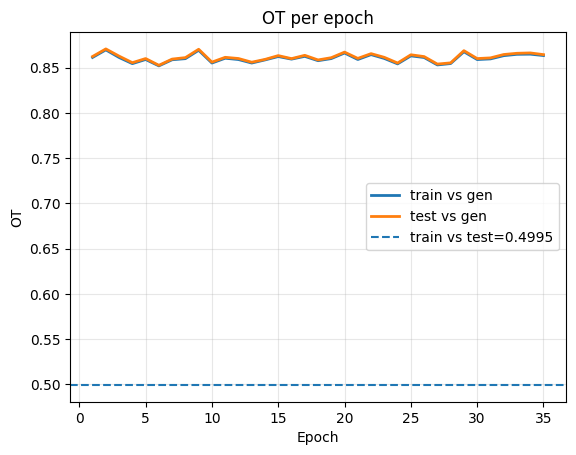

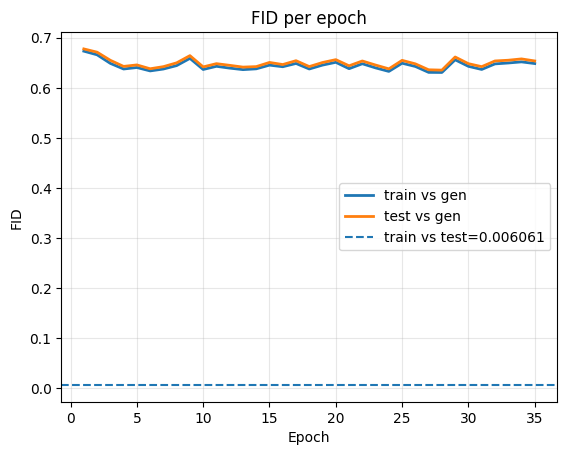

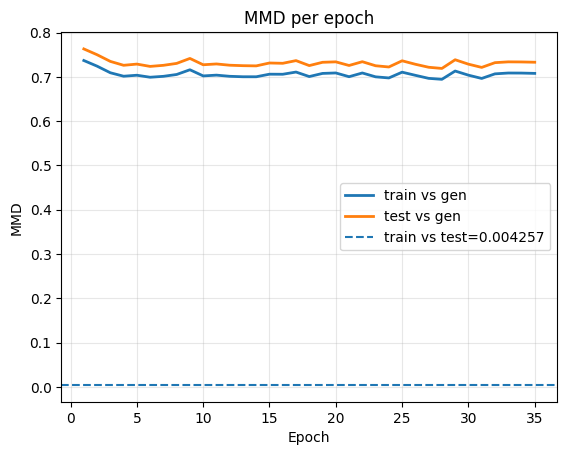

In [ ]:
plot_losses(ot_train_gen, ot_test_gen, ot_train_test, smooth=None, y_label="OT")  # smooth=None for raw curves
plot_losses(fid_train_gen, fid_test_gen, fid_train_test, smooth=None, y_label="FID")  # smooth=None for raw curves
plot_losses(mmd_train_gen, mmd_test_gen, mmd_train_test, smooth=None, y_label="MMD")  # smooth=None for raw curves

In [ ]:
import math
model.eval()
torch.manual_seed(0)

N = 5000        # total images
B = 64          # batch size for sampling
all_imgs = []

with torch.no_grad():
    num_batches = math.ceil(N / B)
    for _ in range(num_batches):
        bs = min(B, N - len(all_imgs))
        x = diffusion.sample(batch_size=bs)   # [bs, 1, 28, 28]
        all_imgs.append(x)

# stack into one big tensor [5000,1,28,28]
imgs = torch.cat(all_imgs, dim=0)[:N]
torch.save(imgs, "gen_mnist.pt")
print("Saved:", imgs.shape)

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/50 [00:00<?, ?it/s]

Saved: torch.Size([5000, 1, 28, 28])


In [ ]:
all_train = []
for x, _ in train_loader:   # ignore labels if not needed
    all_train.append(x)
train_tensor = torch.cat(all_train, dim=0)   # [N_train, C, H, W]
torch.save(train_tensor, "train_mnist.pt")
print("Saved train:", train_tensor.shape)

# Save test set
all_test = []
for x, _ in test_loader:
    all_test.append(x)
test_tensor = torch.cat(all_test, dim=0)     # [N_test, C, H, W]
torch.save(test_tensor, "test_mnist.pt")
print("Saved test:", test_tensor.shape)

ValueError: too many values to unpack (expected 2)

In [ ]:
train_imgs = torch.load("train_mnist.pt")
train_loader = torch.utils.data.DataLoader(train_imgs, batch_size=64, shuffle=True)
test_imgs = torch.load("test_mnist.pt")
test_loader  = torch.utils.data.DataLoader(test_imgs, batch_size=64, shuffle=True)
gen_imgs = torch.load("gen_mnist.pt")   # [5000,1,28,28]
gen_loader = torch.utils.data.DataLoader(imgs, batch_size=64, shuffle=True)

In [ ]:
import matplotlib.pyplot as plt

# if shape is [1,28,28], remove channel dimension
plt.imshow(train_imgs[0][0].cpu().numpy(), cmap="gray")
plt.axis("off")
plt.show()

In [ ]:
!pip install POT

In [ ]:
import ot

In [ ]:
ot_distance = ot.sinkhorn(a, b, M, reg=0.1)

In [ ]:
class SimpleMNISTFeatureNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
        nn.Conv2d(1, 32, 3, 1), nn.ReLU(), nn.MaxPool2d(2),
        nn.Conv2d(32, 64, 3, 1), nn.ReLU(), nn.MaxPool2d(2)
        )
        self.flatten = nn.Flatten()
        self.fc_feat = nn.Linear(64 * 5 * 5, 128)
        self.fc_out = nn.Linear(128, 10)

    def forward(self, x):
        x = self.conv(x)
        x = self.flatten(x)
        feat = F.relu(self.fc_feat(x))
        out = self.fc_out(feat)
        return out, feat # classification output and feature vector

